# [Tensorflow - Help Protect the Great Barrier Reef](https://www.kaggle.com/c/tensorflow-great-barrier-reef)
> Detect crown-of-thorns starfish in underwater image data

In [ ]:
!nvidia-smi

Fri Feb 11 13:59:50 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    24W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# check environment
import os
IN_COLAB = 'COLAB_GPU' in os.environ.keys()
if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/workspace/great_barrier_reef/tensorflow-great-barrier-reef.zip ./
!unzip ./tensorflow-great-barrier-reef.zip

## 📒 Notebooks:
* Train: [Great-Barrier-Reef: YOLOv5 [train] 🌊](https://www.kaggle.com/awsaf49/great-barrier-reef-yolov5-train)
* Infer: [Great-Barrier-Reef: YOLOv5 [infer] 🌊](https://www.kaggle.com/awsaf49/great-barrier-reef-yolov5-infer)

# 🛠 Install Libraries

In [ ]:
!pip install -qU wandb
!pip install -qU bbox-utility # check https://github.com/awsaf49/bbox for source code
if IN_COLAB:
    !pip install -qU numba
    !pip uninstall -y torchtext
    !pip install -qU torch==1.9.1+cu111 torchvision==0.10.1+cu111 torchaudio==0.9.1 -f https://download.pytorch.org/whl/torch_stable.html
    !pip install -qU albumentations==1.1.0
    !pip install "opencv-python-headless<4.3" opencv-python==4.2.0.34

     |████████████████████████████████| 1.7 MB 18.5 MB/s 
     |████████████████████████████████| 144 kB 71.2 MB/s 
     |████████████████████████████████| 180 kB 57.4 MB/s 
     |████████████████████████████████| 63 kB 1.9 MB/s 
     |████████████████████████████████| 58 kB 5.5 MB/s 
     |████████████████████████████████| 3.3 MB 31.3 MB/s 
     |████████████████████████████████| 34.5 MB 14 kB/s 
Found existing installation: torchtext 0.11.0
Uninstalling torchtext-0.11.0:
  Successfully uninstalled torchtext-0.11.0
     |█████████████                   | 834.1 MB 1.3 MB/s eta 0:15:29tcmalloc: large alloc 1147494400 bytes == 0x56219fe9a000 @  0x7f6e8d766615 0x562166bc63bc 0x562166ca718a 0x562166bc91cd 0x562166cbbb3d 0x562166c3d458 0x562166c3802f 0x562166bcaaba 0x562166c3d2c0 0x562166c3802f 0x562166bcaaba 0x562166c39cd4 0x562166cbc986 0x562166c39350 0x562166cbc986 0x562166c39350 0x562166cbc986 0x562166c39350 0x562166bcaf19 0x562166c0ea79 0x562166bc9b32 0x562166c3d1dd 0x562166c3802f 0x56

In [ ]:
!pip list | grep open

intel-openmp                  2022.0.2
opencv-contrib-python         4.1.2.30
opencv-python                 4.2.0.34
opencv-python-headless        4.2.0.34
openpyxl                      3.0.9
smart-open                    5.2.1


# 📚 Import Libraries

In [ ]:
import os
import sys
import math
import shutil
import yaml
import numpy as np
import pandas as pd
import torch
import cv2
from sklearn.model_selection import train_test_split
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
tqdm.pandas()

if not IN_COLAB:
    sys.path.append('../input/tensorflow-great-barrier-reef')

from joblib import Parallel, delayed
from IPython.display import display, HTML
from matplotlib import animation, rc
rc('animation', html='jshtml')

# check https://github.com/awsaf49/bbox for source code of following utility functions
from bbox.utils import coco2yolo, coco2voc, voc2yolo
from bbox.utils import draw_bboxes, load_image
from bbox.utils import clip_bbox, str2annot, annot2str

import wandb

np.random.seed(6036)
colors = [(np.random.randint(255), np.random.randint(255), np.random.randint(255)) for idx in range(1)]

In [ ]:
# check Torch and CUDA version
print(f"Torch: {torch.__version__}")
!nvcc --version

Torch: 1.9.1+cu111
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


# 📦 [YOLOv5](https://github.com/ultralytics/yolov5/)

In [ ]:
#!cp /content/drive/MyDrive/workspace/great_barrier_reef/yolov5/utils/loggers/__init__.py  /content/yolov5/utils/loggers

In [ ]:
%cd /content
!rm -r /content/yolov5
!sleep 1
!#git clone https://github.com/ultralytics/yolov5 # clone
!cp -r /content/drive/MyDrive/workspace/great_barrier_reef/yolov5 ./yolov5

%cd yolov5
%pip install -qr requirements.txt  # install

from yolov5 import utils
display = utils.notebook_init()  # check

%cd /content

YOLOv5 🚀 v6.0-207-g8efe977 torch 1.9.1+cu111 CUDA:0 (Tesla V100-SXM2-16GB, 16160MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 91.4/166.8 GB disk)
/content


# 📌 Key-Points
* One have to submit prediction using the provided **python time-series API**, which makes this competition different from previous Object Detection Competitions.
* Each prediction row needs to include all bounding boxes for the image. Submission is format seems also **COCO** which means `[x_min, y_min, width, height]`
* Copmetition metric `F2` tolerates some false positives(FP) in order to ensure very few starfish are missed. Which means tackling **false negatives(FN)** is more important than false positives(FP). 
$$F2 = 5 \cdot \frac{precision \cdot recall}{4\cdot precision + recall}$$

# ⭐ WandB
<img src="https://camo.githubusercontent.com/dd842f7b0be57140e68b2ab9cb007992acd131c48284eaf6b1aca758bfea358b/68747470733a2f2f692e696d6775722e636f6d2f52557469567a482e706e67" width=600>

Weights & Biases (W&B) is MLOps platform for tracking our experiemnts. We can use it to Build better models faster with experiment tracking, dataset versioning, and model management. Some of the cool features of W&B:

* Track, compare, and visualize ML experiments
* Get live metrics, terminal logs, and system stats streamed to the centralized dashboard.
* Explain how your model works, show graphs of how model versions improved, discuss bugs, and demonstrate progress towards milestones.


In [ ]:
!WANDB_API_KEY='api key is here'

In [ ]:
try:
    wandb.login()
    anonymous = None
except:
    wandb.login(anonymous='must')
    print('To use your W&B account,\nGo to Add-ons -> Secrets and provide your W&B access token. Use the Label name as WANDB. \nGet your W&B access token from here: https://wandb.ai/authorize')

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


# 📖 Meta Data
* `train_images/` - Folder containing training set photos of the form `video_{video_id}/{video_frame}.jpg`.

* `[train/test].csv` - Metadata for the images. As with other test files, most of the test metadata data is only available to your notebook upon submission. Just the first few rows available for download.

* `video_id` - ID number of the video the image was part of. The video ids are not meaningfully ordered.
* `video_frame` - The frame number of the image within the video. Expect to see occasional gaps in the frame number from when the diver surfaced.
* `sequence` - ID of a gap-free subset of a given video. The sequence ids are not meaningfully ordered.
* `sequence_frame` - The frame number within a given sequence.
* `image_id` - ID code for the image, in the format `{video_id}-{video_frame}`
* `annotations` - The bounding boxes of any starfish detections in a string format that can be evaluated directly with Python. Does not use the same format as the predictions you will submit. Not available in test.csv. A bounding box is described by the pixel coordinate `(x_min, y_min)` of its lower left corner within the image together with its `width` and `height` in pixels --> (COCO format).

In [ ]:
import datetime

t_delta = datetime.timedelta(hours=9)
JST = datetime.timezone(t_delta, 'JST')
now = datetime.datetime.now(JST)
D = now.strftime('%m%d-%H%M')

In [ ]:
FOLD      = 2 # which fold to train
DIM       = 3200#2560 #3200#1280 #3840 #3840#3200 #2560 #1280 
MODEL     = 'yolov5s'#'yolov5x6' #'yolov5m6'
BATCH     = 4
EPOCHS    = 20

PROJECT   = 'the-Great-Barrier-Reef' # w&b in yolov5
NAME      = f'{MODEL}-d{DIM}-f{FOLD}-{D}' # w&b for yolov5

if IN_COLAB:
    ROOT_DIR = '.'
    IMAGE_DIR = './images'
    LABEL_DIR = './labels'
else:
    ROOT_DIR  = '/kaggle/input/tensorflow-great-barrier-reef/'
    IMAGE_DIR = '/kaggle/images' # directory to save images
    LABEL_DIR = '/kaggle/labels' # directory to save labels

In [ ]:
PROJECT,NAME

('the-Great-Barrier-Reef', 'yolov5s-d3200-f2-0210-1312')

In [ ]:
seed = 6036
def seed_everything(seed=seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

## Create Directories

In [ ]:
!mkdir -p {IMAGE_DIR}
!mkdir -p {LABEL_DIR}
!cp /content/drive/MyDrive/workspace/great_barrier_reef/train-5folds.csv .

## Get Paths

In [ ]:
def get_bbox(annots):
    bboxes = [list(annot.values()) for annot in annots]
    return bboxes

def get_path(row):
    row['default_image_path'] = f'{ROOT_DIR}/train_images/video_{row.video_id}/{row.video_frame}.jpg'
    return row

In [ ]:
# Train Data
USE_SUBSEQUENCE = False#True

df = pd.read_csv(f"{ROOT_DIR}/train-5folds.csv")
df = df.progress_apply(get_path, axis=1)
df['width']  = 1280
df['height'] = 720
df['image_path']  = f'{IMAGE_DIR}/'+df.image_id+'.jpg'
df['label_path']  = f'{LABEL_DIR}/'+df.image_id+'.txt'
df['annotations'] = df['annotations'].progress_apply(eval)
df['bboxes'] = df.annotations.progress_apply(get_bbox)

display(df.head())
df.shape,df.columns

  0%|          | 0/23501 [00:00<?, ?it/s]

  0%|          | 0/23501 [00:00<?, ?it/s]

  0%|          | 0/23501 [00:00<?, ?it/s]

,video_id,sequence,video_frame,sequence_frame,image_id,...,default_image_path,width,height,label_path,bboxes
0,0,40258,0,0,0-0,...,./train_images/video_0/0.jpg,1280,720,./labels/0-0.txt,[]
1,0,40258,1,1,0-1,...,./train_images/video_0/1.jpg,1280,720,./labels/0-1.txt,[]
2,0,40258,2,2,0-2,...,./train_images/video_0/2.jpg,1280,720,./labels/0-2.txt,[]
3,0,40258,3,3,0-3,...,./train_images/video_0/3.jpg,1280,720,./labels/0-3.txt,[]
4,0,40258,4,4,0-4,...,./train_images/video_0/4.jpg,1280,720,./labels/0-4.txt,[]


((23501, 16),
 Index(['video_id', 'sequence', 'video_frame', 'sequence_frame', 'image_id',
        'annotations', 'n_annotations', 'has_annotations', 'image_path',
        'subsequence_id', 'fold', 'default_image_path', 'width', 'height',
        'label_path', 'bboxes'],
       dtype='object'))

In [ ]:
data = (df['n_annotations']>0).value_counts(normalize=True)*100
print(f"No BBox: {data[0]:0.2f}% | With BBox: {data[1]:0.2f}%")
data = None

No BBox: 79.07% | With BBox: 20.93%


In [ ]:
# Use video sequence
if not USE_SUBSEQUENCE:
    from sklearn.model_selection import GroupKFold

    kf = GroupKFold(n_splits = 10)
    df = df.reset_index(drop=True)
    df['fold'] = -1
    for fold, (train_idx, val_idx) in enumerate(kf.split(df, y = df.video_id.tolist(), groups=df.sequence)):
        df.loc[val_idx, 'fold'] = fold
    display(df.fold.value_counts())

0    2988
1    2959
2    2843
3    2800
6    2016
7    2008
4    2005
8    1962
5    1960
9    1960
Name: fold, dtype: int64

In [ ]:
# Use video id
if not USE_SUBSEQUENCE:
    df['fold'] = df['video_id']

df['fold'].value_counts(normalize=True)*100

2    36.428237
1    35.028297
0    28.543466
Name: fold, dtype: float64

In [ ]:
REMOVE_NOBBOX = True # remove images with no bbox

if REMOVE_NOBBOX:
    df_train = df.query("n_annotations>0")
    df_train_nobox = df.query("n_annotations==0")
else:
    df_train = df.copy()
    df_train_nobox = df.query("n_annotations==0")

#df_train = df_train.reset_index(drop=True)
#df_train_nobox.reset_index(drop=True)

#df_train.shape
df_train['n_annotations'].value_counts(normalize=True)*100
#df['n_annotations'].value_counts(normalize=True)*100
display(df.fold.value_counts())
display(df_train.fold.value_counts())
display(df_train_nobox.fold.value_counts())

0    2988
1    2959
2    2843
3    2800
6    2016
7    2008
4    2005
8    1962
5    1960
9    1960
Name: fold, dtype: int64

2    1100
8     914
5     720
1     654
6     599
4     314
9     289
7     258
0      71
Name: fold, dtype: int64

0    2917
3    2800
1    2305
7    1750
2    1743
4    1691
9    1671
6    1417
5    1240
8    1048
Name: fold, dtype: int64

In [ ]:
# sample no cots images
df_train_nobox_fold = df_train_nobox.query('fold==@FOLD')
df_train_nobox_oof = df_train_nobox.query('fold!=@FOLD')

n_sample = math.floor(df_train.shape[0]*0.2)
test_size = 0.2
nobox_val = df_train_nobox_fold.sample(n=math.floor(n_sample*test_size), random_state=seed)
nobox_train = df_train_nobox_oof.sample(n=math.floor(n_sample*(1 - test_size)), random_state=seed)
nobox_train.shape[0], nobox_val.shape[0]

(786, 196)

In [ ]:
display(nobox_train.head())
display(nobox_val.head())

,video_id,sequence,video_frame,sequence_frame,image_id,...,default_image_path,width,height,label_path,bboxes
3404,0,45015,5868,166,0-5868,...,./train_images/video_0/5868.jpg,1280,720,./labels/0-5868.txt,[]
5912,0,996,11552,127,0-11552,...,./train_images/video_0/11552.jpg,1280,720,./labels/0-11552.txt,[]
8348,1,15827,2240,322,1-2240,...,./train_images/video_1/2240.jpg,1280,720,./labels/1-2240.txt,[]
13167,1,60754,9602,1186,1-9602,...,./train_images/video_1/9602.jpg,1280,720,./labels/1-9602.txt,[]
8344,1,15827,2236,318,1-2236,...,./train_images/video_1/2236.jpg,1280,720,./labels/1-2236.txt,[]


,video_id,sequence,video_frame,sequence_frame,image_id,...,default_image_path,width,height,label_path,bboxes
10223,1,8503,5071,1243,1-5071,...,./train_images/video_1/5071.jpg,1280,720,./labels/1-5071.txt,[]
9166,1,8503,4014,186,1-4014,...,./train_images/video_1/4014.jpg,1280,720,./labels/1-4014.txt,[]
11305,1,8503,6153,2325,1-6153,...,./train_images/video_1/6153.jpg,1280,720,./labels/1-6153.txt,[]
11257,1,8503,6105,2277,1-6105,...,./train_images/video_1/6105.jpg,1280,720,./labels/1-6105.txt,[]
9482,1,8503,4330,502,1-4330,...,./train_images/video_1/4330.jpg,1280,720,./labels/1-4330.txt,[]


In [ ]:
# merge df
MERGE_NOBBOX = True
if REMOVE_NOBBOX and MERGE_NOBBOX:
    df_train_all = pd.concat((df_train, nobox_train, nobox_val))
    df_train_all = df_train_all.sort_index().reset_index(drop=True)
else:
    df_train_all = df_train.copy()
    df_train_all.sort_index().reset_index(drop=True)
    
(df_train_all['n_annotations']>0).value_counts(normalize=True)*100

True     83.358753
False    16.641247
Name: n_annotations, dtype: float64

# ✏️ Write Images
* We need to copy the Images to Current Directory(`/kaggle/working`) as `/kaggle/input` doesn't have **write access** which is needed for **YOLOv5**.
* We can make this process faster using **Joblib** which uses **Parallel** computing.

In [ ]:
def make_copy(row):
    shutil.copyfile(row['default_image_path'], row['image_path'])
    return

In [ ]:
%cd /content
image_paths = df['default_image_path'].tolist()
_ = Parallel(n_jobs=-1, backend='threading')(delayed(make_copy)(row) for _, row in tqdm(df.iterrows(), total=len(df)))

/content


  0%|          | 0/23501 [00:00<?, ?it/s]

# 🏷️ Create Labels
We need to export our labels to **YOLO** format, with one `*.txt` file per image (if no objects in image, no `*.txt` file is required). The *.txt file specifications are:

* One row per object
* Each row is class `[x_center, y_center, width, height]` format.
* Box coordinates must be in **normalized** `xywh` format (from `0 - 1`). If your boxes are in pixels, divide `x_center` and `width` by `image width`, and `y_center` and `height` by `image height`.
* Class numbers are **zero-indexed** (start from `0`).

> Competition bbox format is **COCO** hence `[x_min, y_min, width, height]`. So, we need to convert form **COCO** to **YOLO** format.


In [ ]:
%cd /content

/content


In [ ]:
cnt = 0
all_bboxes = []
bboxes_info = []
for row_idx in tqdm(range(df_train_all.shape[0])):
    row = df_train_all.iloc[row_idx]
    image_height = row.height
    image_width  = row.width
    bboxes_coco  = np.array(row.bboxes).astype(np.float32).copy()
    num_bbox     = len(bboxes_coco)
    names        = ['cots']*num_bbox
    labels       = np.array([0]*num_bbox)[..., None].astype(str)
    ## Create Annotation(YOLO)
    with open(row.label_path, 'w') as f:
        if num_bbox<1:
            annot = ''
            f.write(annot)
            cnt+=1
            continue
        bboxes_voc  = coco2voc(bboxes_coco, image_height, image_width)
        bboxes_voc  = clip_bbox(bboxes_voc, image_height, image_width)
        bboxes_yolo = voc2yolo(bboxes_voc, image_height, image_width).astype(str)
        all_bboxes.extend(bboxes_yolo.astype(float))
        bboxes_info.extend([[row.image_id, row.video_id, row.sequence]]*len(bboxes_yolo))
        annots = np.concatenate([labels, bboxes_yolo], axis=1)
        string = annot2str(annots)
        f.write(string)
print('Missing:',cnt)

  0%|          | 0/5901 [00:00<?, ?it/s]

Missing: 982


# ⭕ BBox Distribution

In [ ]:
bbox_df = pd.DataFrame(np.concatenate([bboxes_info, all_bboxes], axis=1),
             columns=['image_id','video_id','sequence',
                     'xmid','ymid','w','h'])
bbox_df[['xmid','ymid','w','h']] = bbox_df[['xmid','ymid','w','h']].astype(float)
bbox_df['area'] = bbox_df.w * bbox_df.h * 1280 * 720
bbox_df = bbox_df.merge(df_train[['image_id','fold']], on='image_id', how='left')
bbox_df.head(2)

,image_id,video_id,sequence,xmid,ymid,w,h,area,fold
0,0-16,0,40258,0.456250,0.318056,0.039062,0.044444,1600.00092,4
1,0-17,0,40258,0.455469,0.318056,0.039062,0.044444,1600.00092,4


## `x_center` Vs `y_center`

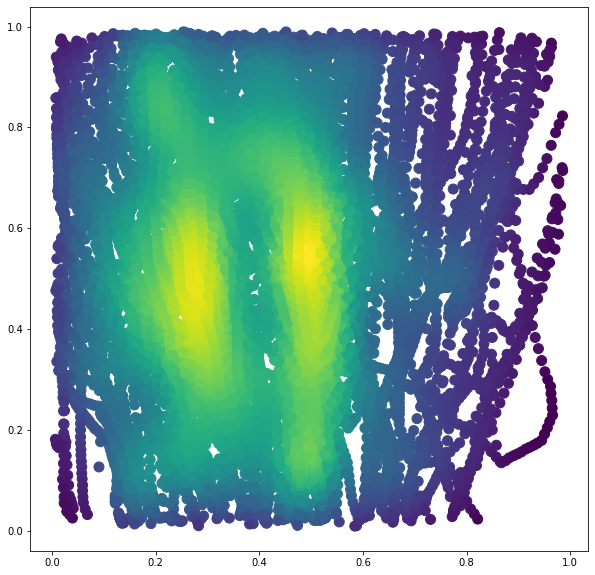

In [ ]:
from scipy.stats import gaussian_kde

all_bboxes = np.array(all_bboxes)

x_val = all_bboxes[...,0]
y_val = all_bboxes[...,1]

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# ax.set_xlabel('x_mid')
# ax.set_ylabel('y_mid')
plt.show()

## `width` Vs `height`

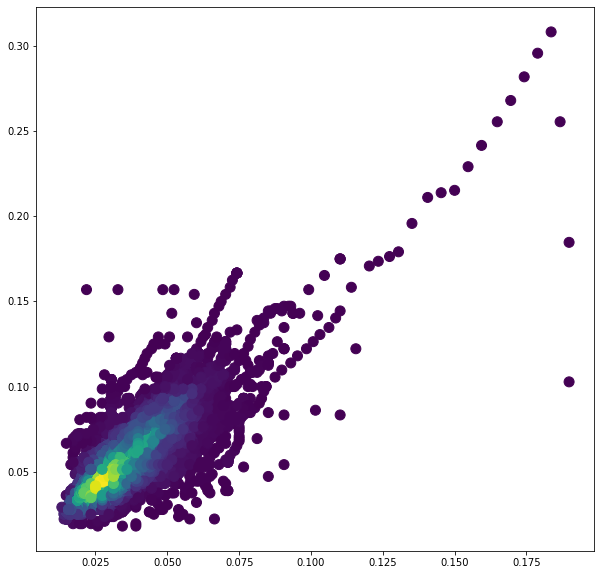

In [ ]:
x_val = all_bboxes[...,2]
y_val = all_bboxes[...,3]

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots(figsize = (10, 10))
# ax.axis('off')
ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# ax.set_xlabel('bbox_width')
# ax.set_ylabel('bbox_height')
plt.show()

## Area

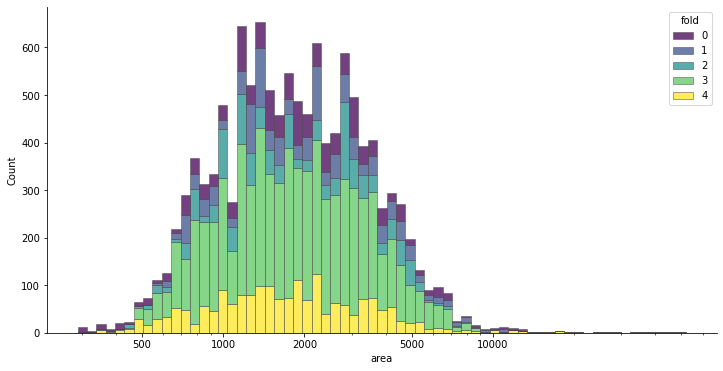

In [ ]:
import matplotlib as mpl
import seaborn as sns

f, ax = plt.subplots(figsize=(12, 6))
sns.despine(f)

sns.histplot(
    bbox_df,
    x="area", hue="fold",
    multiple="stack",
    palette="viridis",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)
ax.xaxis.set_major_formatter(mpl.ticker.ScalarFormatter())
ax.set_xticks([500, 1000, 2000, 5000, 10000]);

# 🌈 Visualization

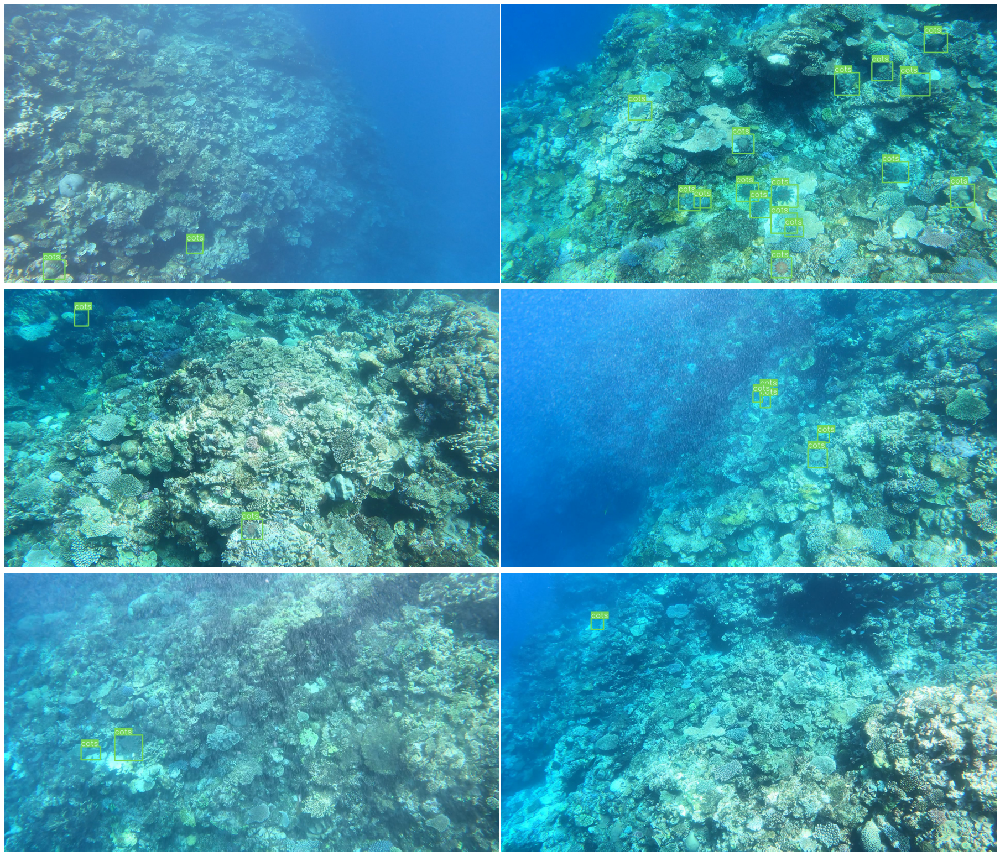

In [ ]:
df2 = df[(df.num_bbox>0)].sample(100) # takes samples with bbox
y = 3; x = 2
plt.figure(figsize=(12.8*x, 7.2*y))
for idx in range(x*y):
    row = df2.iloc[idx]
    img           = load_image(row.image_path)
    image_height  = row.height
    image_width   = row.width
    with open(row.label_path) as f:
        annot = str2annot(f.read())
    bboxes_yolo = annot[...,1:]
    labels      = annot[..., 0].astype(int).tolist()
    names         = ['cots']*len(bboxes_yolo)
    plt.subplot(y, x, idx+1)
    plt.imshow(draw_bboxes(img = img,
                           bboxes = bboxes_yolo, 
                           classes = names,
                           class_ids = labels,
                           class_name = True, 
                           colors = colors, 
                           bbox_format = 'yolo',
                           line_thickness = 2))
    plt.axis('OFF')
plt.tight_layout()
plt.show()

# 🍚 Dataset

In [ ]:
train_files = []
val_files   = []
train_df = df_train_all.query("fold!=@FOLD")
valid_df = df_train_all.query("fold==@FOLD")
train_files += list(train_df.image_path.unique())
val_files += list(valid_df.image_path.unique())
len(train_files), len(val_files)

(4605, 1296)

# ⚙️ Configuration
The dataset config file requires
1. The dataset root directory path and relative paths to `train / val / test` image directories (or *.txt files with image paths)
2. The number of classes `nc` and 
3. A list of class `names`:`['cots']`

In [ ]:

if IN_COLAB:
    cwd = '/content'
    data_path = '/content'
else:
    cwd = '/kaggle/working/'
    data_path = './kaggle/working/'

with open(os.path.join( cwd , 'train.txt'), 'w') as f:
    for path in train_df.image_path.tolist():
        f.write(path+'\n')
            
with open(os.path.join(cwd , 'val.txt'), 'w') as f:
    for path in valid_df.image_path.tolist():
        f.write(path+'\n')

data = dict(
    path  = data_path,
    train =  os.path.join( cwd , 'train.txt') ,
    val   =  os.path.join( cwd , 'val.txt' ),
    nc    = 1,
    names = ['cots'],
)

with open(os.path.join( cwd , 'gbr.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(os.path.join( cwd , 'gbr.yaml'), 'r')
print('\nyaml:')
print(f.read())


yaml:
names:
- cots
nc: 1
path: /content
train: /content/train.txt
val: /content/val.txt



In [ ]:
%%writefile /content/hyp.yaml
# YOLOv5 🚀 by Ultralytics, GPL-3.0 license
# Hyperparameters for high-augmentation COCO training from scratch
# python train.py --batch 32 --cfg yolov5m6.yaml --weights '' --data coco.yaml --img 1280 --epochs 300
# See tutorials for hyperparameter evolution https://github.com/ultralytics/yolov5#tutorials
lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.1  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  #0.937   SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.3  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 0.5  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.5  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.5  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.5  # image mixup (probability)
copy_paste: 0.1  # segment copy-paste (probability)

Writing /content/hyp.yaml


In [ ]:
%%writefile /content/hyp.yaml
##
# Original hyp.yaml
#
# YOLOv5 🚀 by Ultralytics, GPL-3.0 license
# Hyperparameters for high-augmentation COCO training from scratch
# python train.py --batch 32 --cfg yolov5m6.yaml --weights '' --data coco.yaml --img 1280 --epochs 300
# See tutorials for hyperparameter evolution https://github.com/ultralytics/yolov5#tutorials
lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)
lrf: 0.2  # final OneCycleLR learning rate (lr0 * lrf)
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay 5e-4
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.3  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 0.7  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
# anchors: 3  # anchors per output layer (0 to ignore)
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.9  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.1  # image mixup (probability)
copy_paste: 0.1  # segment copy-paste (probability)

Writing /content/hyp.yaml


# 🚅 Training

In [ ]:
%cd /content/yolov5/

/content/yolov5


In [ ]:
!python train.py --help

wandb: Currently logged in as: wellflat (use `wandb login --relogin` to force relogin)
usage: train.py [-h] [--weights WEIGHTS] [--cfg CFG] [--data DATA] [--hyp HYP]
                [--epochs EPOCHS] [--batch-size BATCH_SIZE] [--imgsz IMGSZ]
                [--rect] [--resume [RESUME]] [--nosave] [--noval]
                [--noautoanchor] [--evolve [EVOLVE]] [--bucket BUCKET]
                [--cache [CACHE]] [--image-weights] [--device DEVICE]
                [--multi-scale] [--single-cls] [--optimizer {SGD,Adam,AdamW}]
                [--sync-bn] [--workers WORKERS] [--project PROJECT]
                [--name NAME] [--exist-ok] [--quad] [--linear-lr]
                [--label-smoothing LABEL_SMOOTHING] [--patience PATIENCE]
                [--freeze FREEZE [FREEZE ...]] [--save-period SAVE_PERIOD]
                [--local_rank LOCAL_RANK] [--entity ENTITY]
                [--upload_dataset [UPLOAD_DATASET]]
                [--bbox_interval BBOX_INTERVAL]
                [--artifact_al

In [ ]:
PROJECT,NAME,DIM,BATCH,EPOCHS,MODEL

('the-Great-Barrier-Reef',
 'yolov5s-d3200-f2-0210-1312',
 3200,
 4,
 20,
 'yolov5s')

In [ ]:
!free -h

              total        used        free      shared  buff/cache   available
Mem:            12G        2.6G        825M        1.2M        9.3G        9.9G
Swap:            0B          0B          0B


In [ ]:
!python train.py \
--project {PROJECT} --name {NAME} \
--img {DIM} \
--batch 2 \
--epochs 20 \
--data /content/gbr.yaml \
--hyp /content/hyp.yaml \
--weights {MODEL}.pt \
--exist-ok

wandb: Currently logged in as: wellflat (use `wandb login --relogin` to force relogin)
train: weights=yolov5s.pt, cfg=, data=/content/gbr.yaml, hyp=/content/hyp.yaml, epochs=20, batch_size=2, imgsz=3200, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=the-Great-Barrier-Reef, name=yolov5s-d3200-f2-0210-1312, exist_ok=True, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 283, done.
remote: Counting objects: 100% (133/133), done.
remote: Total 283 (delta 133), reused 133 (delta 133), pack-reused 150
Receiving objects: 100% (283/283), 171.61 KiB | 24.52 MiB/s, done.
Resolving deltas: 100% (200/200), completed with 28 local objects.
From https://github.com/ul

# ✨ Overview


## Output Files

In [ ]:
OUTPUT_DIR = '{}/{}'.format(PROJECT, NAME)
!ls {OUTPUT_DIR}

confusion_matrix.png				   results.png
events.out.tfevents.1644467146.cd0b73c7f3f8.770.0  train_batch0.jpg
F2_curve.png					   train_batch1.jpg
hyp.yaml					   train_batch2.jpg
labels_correlogram.jpg				   val_batch0_labels.jpg
labels.jpg					   val_batch0_pred.jpg
opt.yaml					   val_batch1_labels.jpg
P_curve.png					   val_batch1_pred.jpg
PR_curve.png					   val_batch2_labels.jpg
R_curve.png					   val_batch2_pred.jpg
results.csv					   weights


In [ ]:
!cp -R {OUTPUT_DIR}  /content/drive/MyDrive/workspace/great_barrier_reef/the-Great-Barrier-Reef

# Inference

In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
from bbox.utils import coco2yolo, coco2voc, voc2yolo, voc2coco, yolo2voc, yolo2coco, draw_bboxes, load_image, plot_one_box, clip_bbox, str2annot, annot2str

In [ ]:
CKPT_PATH = '/content/drive/MyDrive/workspace/great_barrier_reef/the-Great-Barrier-Reef/yolov5l6-d1280-f1-0125-2323/weights/best.pt'

def load_model(ckpt_path, conf=0.1, iou=0.35):
    model = torch.hub.load(
        './',
        'custom',
        path=CKPT_PATH,
        source='local',
        force_reload=True
    )  # local repo
    model.conf = conf  # NMS confidence threshold
    model.iou  = iou  # NMS IoU threshold
    model.classes = None   # (optional list) filter by class, i.e. = [0, 15, 16] for persons, cats and dogs
    model.multi_label = False  # NMS multiple labels per box
    model.max_det = 1000  # maximum number of detections per image
    return model

In [ ]:
def predict(model, img, size=768, augment=False):
    height, width = img.shape[:2]
    results = model(img, size=size, augment=augment)  # custom inference size
    preds   = results.pandas().xyxy[0]
    bboxes  = preds[['xmin','ymin','xmax','ymax']].values
    if len(bboxes):
        bboxes  = voc2coco(bboxes,height,width).astype(int)
        confs   = preds.confidence.values
        return bboxes, confs
    else:
        return [],[]
    
def format_prediction(bboxes, confs):
    annot = ''
    if len(bboxes)>0:
        for idx in range(len(bboxes)):
            xmin, ymin, w, h = bboxes[idx]
            conf             = confs[idx]
            annot += f'{conf} {xmin} {ymin} {w} {h}'
            annot +=' '
        annot = annot.strip(' ')
    return annot

def show_img(img, bboxes, bbox_format='yolo'):
    names  = ['starfish']*len(bboxes)
    labels = [0]*len(bboxes)
    img    = draw_bboxes(img = img,
                           bboxes = bboxes, 
                           classes = names,
                           class_ids = labels,
                           class_name = True, 
                           colors = colors, 
                           bbox_format = bbox_format,
                           line_thickness = 2)
    return Image.fromarray(img).resize((800, 400))

In [ ]:
CV_ALL_IMAGES = False
if CV_ALL_IMAGES:
    # with all val images
    val_target = df['fold'] == FOLD
    val_bboxes = df[val_target]['bboxes']
    gt_bboxes_list = [np.array(b) for b in val_bboxes.values]
else:
    # without no target images
    val_target = df_train['fold'] == FOLD
    val_bboxes = df_train[val_target]['bboxes']
    gt_bboxes_list = [np.array(b) for b in val_bboxes.values]


In [ ]:
if CV_ALL_IMAGES:
    image_path_list = df[val_target]['image_path']
else:
    image_path_list = df_train[val_target]['image_path']
print(image_path_list.shape)
pred_bboxes_list = []

CONF=0.1
IOU=0.35
model = load_model(CKPT_PATH, conf=CONF, iou=IOU)

(2099,)
requirements: PyYAML>=5.3.1 not found and is required by YOLOv5, attempting auto-update...

requirements: torch>=1.7.0 not found and is required by YOLOv5, attempting auto-update...

requirements: torchvision>=0.8.1 not found and is required by YOLOv5, attempting auto-update...


YOLOv5 🚀 v6.0-207-g8efe977 torch 1.9.1+cu111 CUDA:0 (A100-SXM4-40GB, 40536MiB)




requirements: 3 packages updated per /content/yolov5/requirements.txt
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



Fusing layers... 
Model Summary: 476 layers, 76118664 parameters, 0 gradients, 110.0 GFLOPs
Adding AutoShape... 


In [ ]:
for idx, path in enumerate(image_path_list):
    img = load_image(f'/content/{path}')
    bboxes, scores = predict(model, img, size=DIM, augment=False)
    #display(show_img(img, bboxes, bbox_format='coco'))
    #if idx > 5:
    #    break
    if len(scores) == 0 and len(bboxes) == 0:
        pred_bboxes_list.append([])
    else:
        u = torch.from_numpy(scores).unsqueeze(1)
        c = torch.cat((u, torch.from_numpy(bboxes)), dim=1)
        pred_bboxes_list.append(c.numpy())

## Global f2 metric implementation

In [ ]:
def calc_iou(bboxes1, bboxes2, bbox_mode='xywh'):
    assert len(bboxes1.shape) == 2 and bboxes1.shape[1] == 4
    assert len(bboxes2.shape) == 2 and bboxes2.shape[1] == 4
    
    bboxes1 = bboxes1.copy()
    bboxes2 = bboxes2.copy()
    
    if bbox_mode == 'xywh':
        bboxes1[:, 2:] += bboxes1[:, :2]
        bboxes2[:, 2:] += bboxes2[:, :2]

    x11, y11, x12, y12 = np.split(bboxes1, 4, axis=1)
    x21, y21, x22, y22 = np.split(bboxes2, 4, axis=1)
    xA = np.maximum(x11, np.transpose(x21))
    yA = np.maximum(y11, np.transpose(y21))
    xB = np.minimum(x12, np.transpose(x22))
    yB = np.minimum(y12, np.transpose(y22))
    interArea = np.maximum((xB - xA + 1), 0) * np.maximum((yB - yA + 1), 0)
    boxAArea = (x12 - x11 + 1) * (y12 - y11 + 1)
    boxBArea = (x22 - x21 + 1) * (y22 - y21 + 1)
    iou = interArea / (boxAArea + np.transpose(boxBArea) - interArea)
    return iou

def f_beta(tp, fp, fn, beta=2):
    return 5*tp / (5*tp + 4*fn + fp)
    #return (1+beta**2)*tp / ((1+beta**2)*tp + beta**2*fn+fp)

def calc_is_correct_at_iou_th(gt_bboxes, pred_bboxes, iou_th, verbose=False):
    gt_bboxes = gt_bboxes.copy()
    pred_bboxes = pred_bboxes.copy()
    
    tp = 0
    fp = 0
    for k, pred_bbox in enumerate(pred_bboxes): # fixed in ver.7
        ious = calc_iou(gt_bboxes, pred_bbox[None, 1:])
        max_iou = ious.max()
        if max_iou > iou_th:
            tp += 1
            gt_bboxes = np.delete(gt_bboxes, ious.argmax(), axis=0)
        else:
            fp += 1
        if len(gt_bboxes) == 0:
            fp += len(pred_bboxes) - (k + 1) # fix in ver.7
            break

    fn = len(gt_bboxes)
    return tp, fp, fn

def calc_is_correct(gt_bboxes, pred_bboxes):
    """
    gt_bboxes: (N, 4) np.array in xywh format
    pred_bboxes: (N, 5) np.array in conf+xywh format
    """
    if len(gt_bboxes) == 0 and len(pred_bboxes) == 0:
        tps, fps, fns = 0, 0, 0
        return tps, fps, fns
    
    elif len(gt_bboxes) == 0:
        tps, fps, fns = 0, len(pred_bboxes), 0
        return tps, fps, fns
    
    elif len(pred_bboxes) == 0:
        tps, fps, fns = 0, 0, len(gt_bboxes)
        return tps, fps, fns
    
    pred_bboxes = pred_bboxes[pred_bboxes[:,0].argsort()[::-1]] # sort by conf
    
    tps, fps, fns = 0, 0, 0
    for iou_th in np.arange(0.3, 0.85, 0.05):
        tp, fp, fn = calc_is_correct_at_iou_th(gt_bboxes, pred_bboxes, iou_th)
        tps += tp
        fps += fp
        fns += fn
    return tps, fps, fns

def calc_f2_score(gt_bboxes_list, pred_bboxes_list, verbose=False):
    """
    gt_bboxes_list: list of (N, 4) np.array in xywh format
    pred_bboxes_list: list of (N, 5) np.array in conf+xywh format
    """
    tps, fps, fns = 0, 0, 0
    for gt_bboxes, pred_bboxes in zip(gt_bboxes_list, pred_bboxes_list):
        tp, fp, fn = calc_is_correct(gt_bboxes, pred_bboxes)
        tps += tp
        fps += fp
        fns += fn
        if verbose:
            num_gt = len(gt_bboxes)
            num_pred = len(pred_bboxes)
            print(f'num_gt:{num_gt:<3} num_pred:{num_pred:<3} tp:{tp:<3} fp:{fp:<3} fn:{fn:<3}')
    return f_beta(tps, fps, fns, beta=2)

In [ ]:
pred_bboxes_xywh_list = []
for b in pred_bboxes_list:
    if len(b) != 0:
       cxywh = np.hstack((b[:, :3], (b[:, 3:] - b[:, 1:3])))
    pred_bboxes_xywh_list.append(cxywh)


In [ ]:
score = calc_f2_score(gt_bboxes_list, pred_bboxes_list, verbose=False)
score

0.885061863412963

# Validate

In [ ]:
!cp -r  /content/drive/MyDrive/workspace/great_barrier_reef/the-Great-Barrier-Reef/yolov5s6-d3200-f1-0204-1721 .

In [ ]:
%cd /content/yolov5
!python val.py --help

In [ ]:
CKPT = '/content/yolov5s6-d3200-f1-0204-1721/weights/best.pt'
!python val.py --weights {CKPT} \
--project {PROJECT} --name {NAME} \
--data /content/gbr.yaml \
--imgsz 6400 \
--batch-size 4 \
--conf-thres 0.001 \
--iou-thres 0.35 \
--augment

val: data=/content/gbr.yaml, weights=['/content/yolov5s6-d3200-f1-0204-1721/weights/best.pt'], batch_size=4, imgsz=6400, conf_thres=0.001, iou_thres=0.35, task=val, device=, workers=8, single_cls=False, augment=True, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=the-Great-Barrier-Reef, name=yolov5s6-d3200-f1-0205-2342, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.0-207-g8efe977 torch 1.9.1+cu111 CUDA:0 (Tesla V100-SXM2-16GB, 16160MiB)

Fusing layers... 
Model Summary: 280 layers, 12308200 parameters, 0 gradients, 16.2 GFLOPs
val: Scanning '/content/val.cache' images and labels... 8232 found, 0 missing, 6133 empty, 0 corrupt: 100% 8232/8232 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95         f2:   0% 0/2058 [00:00<?, ?it/s]tcmalloc: large alloc 1131872256 bytes == 0x559219a4c000 @  0x7f729ef2ab6b 0x7f729ef4a379 0x7f71e76cc26e 0x7f71e76cd9e2 0x7f71e98fd703 0x7f71e8e3380b 0x7f71e

# 📈 Class Distribution

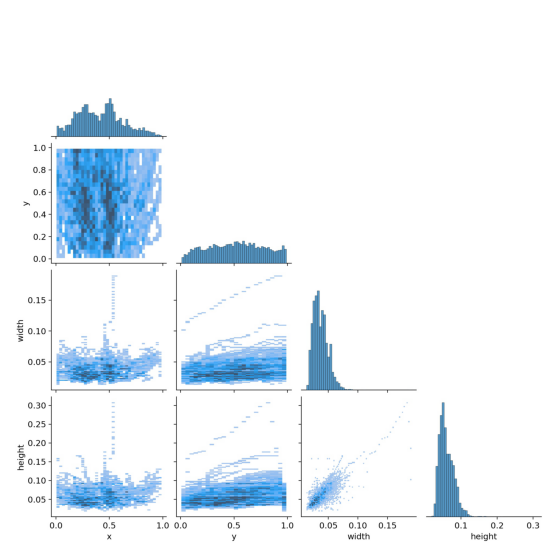

In [ ]:
plt.figure(figsize = (10,10))
plt.axis('off')
plt.imshow(plt.imread(f'{OUTPUT_DIR}/labels_correlogram.jpg'));

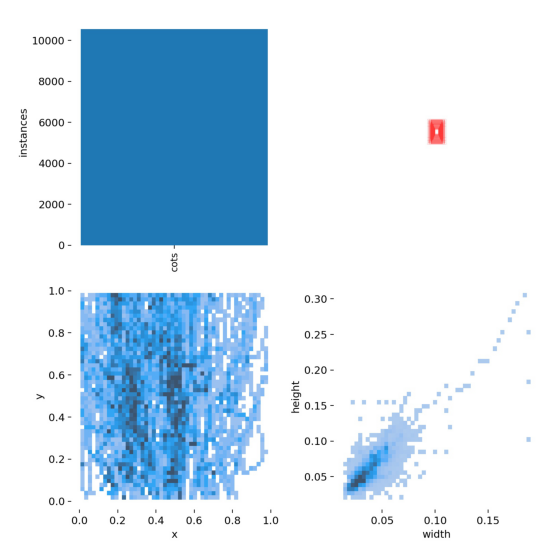

In [ ]:
plt.figure(figsize = (10,10))
plt.axis('off')
plt.imshow(plt.imread(f'{OUTPUT_DIR}/labels.jpg'));

# 🔭 Batch Image

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10, 10))
plt.imshow(plt.imread(f'{OUTPUT_DIR}/train_batch0.jpg'))

plt.figure(figsize = (10, 10))
plt.imshow(plt.imread(f'{OUTPUT_DIR}/train_batch1.jpg'))

plt.figure(figsize = (10, 10))
plt.imshow(plt.imread(f'{OUTPUT_DIR}/train_batch2.jpg'))

## GT Vs Pred

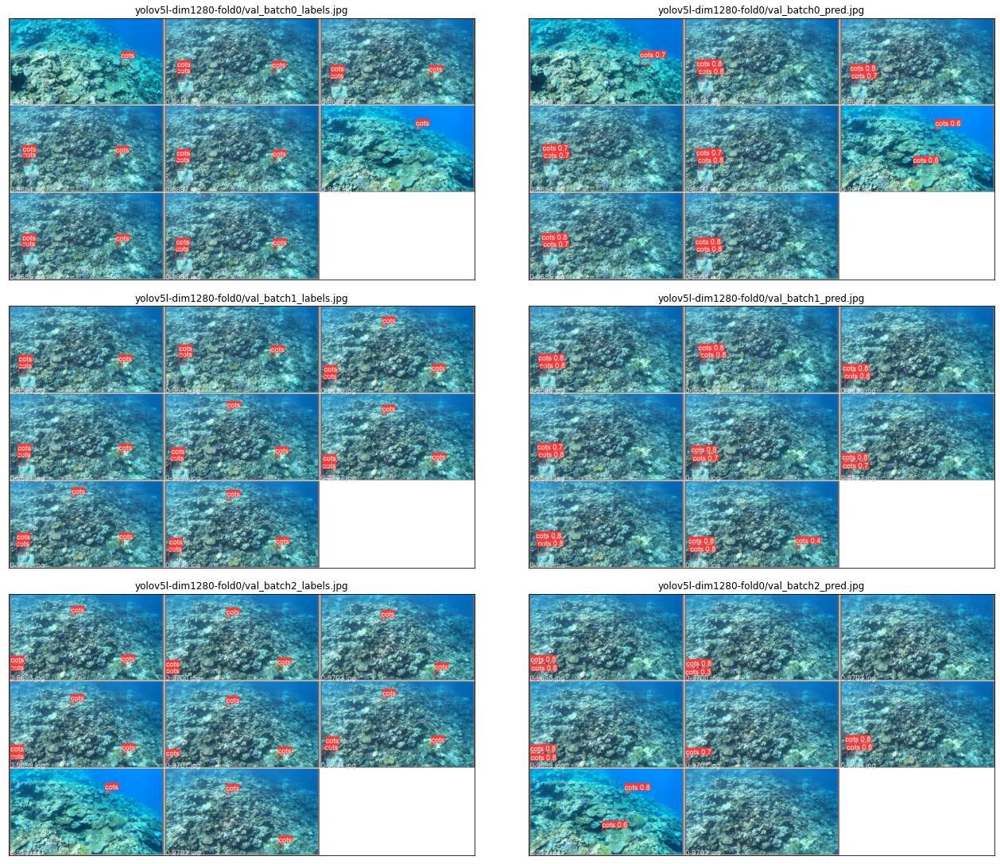

In [ ]:
fig, ax = plt.subplots(3, 2, figsize = (2*9,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'{OUTPUT_DIR}/val_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'{OUTPUT_DIR}/val_batch{row}_labels.jpg', fontsize = 12)
    
    ax[row][1].imshow(plt.imread(f'{OUTPUT_DIR}/val_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'{OUTPUT_DIR}/val_batch{row}_pred.jpg', fontsize = 12)
plt.show()

# 🔍 Result

## Score Vs Epoch

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread(f'{OUTPUT_DIR}/results.png'));

## Confusion Matrix

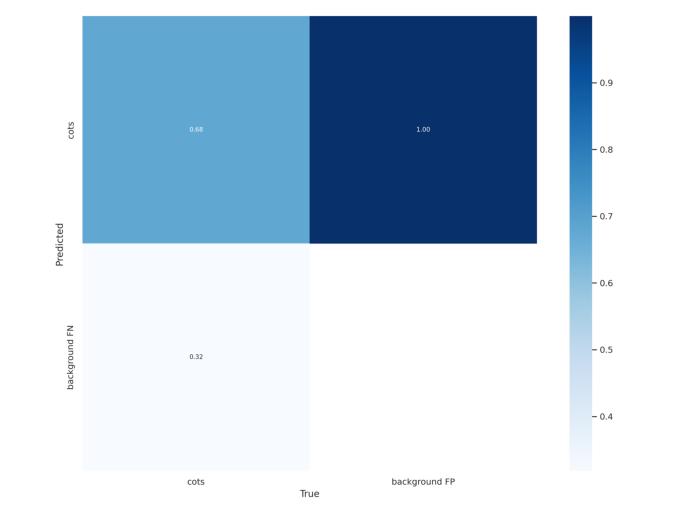

In [ ]:
plt.figure(figsize=(12,10))
plt.axis('off')
plt.imshow(plt.imread(f'{OUTPUT_DIR}/confusion_matrix.png'));

## Metrics

Metric: F2
Metric: PR
Metric: P
Metric: R


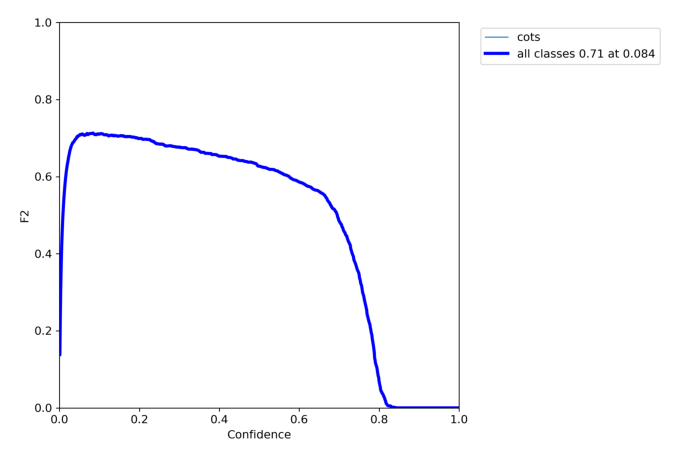

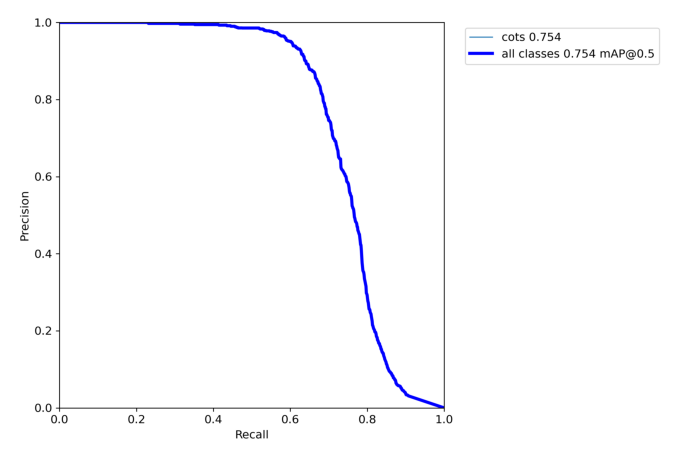

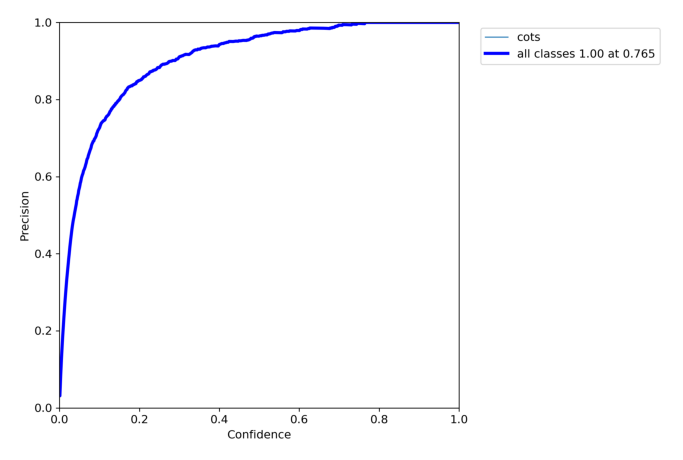

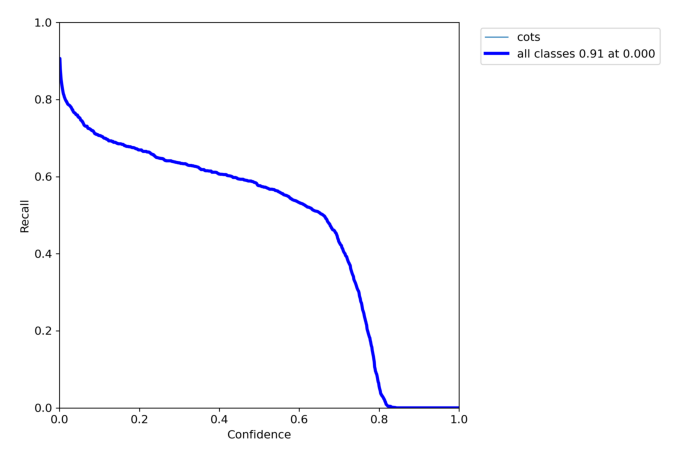

In [ ]:
for metric in ['F2', 'PR', 'P', 'R']:
    print(f'Metric: {metric}')
    plt.figure(figsize=(12,10))
    plt.axis('off')
    plt.imshow(plt.imread(f'{OUTPUT_DIR}/{metric}_curve.png'));
    plt.show()